### Importing Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import hvplot
import hvplot.pandas

%matplotlib inline
sns.set_style("whitegrid")
plt.style.use("fivethirtyeight")

pd.set_option("display.float_format", "{:.2f}".format)
pd.set_option("display.max_columns", 80)
pd.set_option("display.max_rows", 80)

In [2]:
df = pd.read_csv("Employee_Attrition.csv")
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Y,Yes,11,3,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,Y,No,23,4,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,Y,Yes,15,3,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,Y,Yes,11,3,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,Y,No,12,3,4,80,1,6,3,3,2,2,2,2


 ## Exploratory Data Analysis

In [3]:
df.describe()

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00
mean,36.92,802.49,9.19,2.91,1.00,1024.87,2.72,65.89,2.73,2.06,2.73,6502.93,14313.10,2.69,15.21,3.15,2.71,80.00,0.79,11.28,2.80,2.76,7.01,4.23,2.19,4.12
std,9.14,403.51,8.11,1.02,0.00,602.02,1.09,20.33,0.71,1.11,1.10,4707.96,7117.79,2.50,3.66,0.36,1.08,0.00,0.85,7.78,1.29,0.71,6.13,3.62,3.22,3.57
min,18.00,102.00,1.00,1.00,1.00,1.00,1.00,30.00,1.00,1.00,1.00,1009.00,2094.00,0.00,11.00,3.00,1.00,80.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00
25%,30.00,465.00,2.00,2.00,1.00,491.25,2.00,48.00,2.00,1.00,2.00,2911.00,8047.00,1.00,12.00,3.00,2.00,80.00,0.00,6.00,2.00,2.00,3.00,2.00,0.00,2.00
50%,36.00,802.00,7.00,3.00,1.00,1020.50,3.00,66.00,3.00,2.00,3.00,4919.00,14235.50,2.00,14.00,3.00,3.00,80.00,1.00,10.00,3.00,3.00,5.00,3.00,1.00,3.00
75%,43.00,1157.00,14.00,4.00,1.00,1555.75,4.00,83.75,3.00,3.00,4.00,8379.00,20461.50,4.00,18.00,3.00,4.00,80.00,1.00,15.00,3.00,3.00,9.00,7.00,3.00,7.00
max,60.00,1499.00,29.00,5.00,1.00,2068.00,4.00,100.00,4.00,5.00,4.00,19999.00,26999.00,9.00,25.00,4.00,4.00,80.00,3.00,40.00,6.00,4.00,40.00,18.00,15.00,17.00


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

In [5]:
for column in df.columns:
    print(f"{column}: Number of unique values {df[column].nunique()}")
    print("--------------------------------------------------------")

Age: Number of unique values 43
--------------------------------------------------------
Attrition: Number of unique values 2
--------------------------------------------------------
BusinessTravel: Number of unique values 3
--------------------------------------------------------
DailyRate: Number of unique values 886
--------------------------------------------------------
Department: Number of unique values 3
--------------------------------------------------------
DistanceFromHome: Number of unique values 29
--------------------------------------------------------
Education: Number of unique values 5
--------------------------------------------------------
EducationField: Number of unique values 6
--------------------------------------------------------
EmployeeCount: Number of unique values 1
--------------------------------------------------------
EmployeeNumber: Number of unique values 1470
--------------------------------------------------------
EnvironmentSatisfaction: Number 

In [6]:
df.drop(['EmployeeCount', 'EmployeeNumber', 'Over18', 'StandardHours'], axis="columns", inplace=True)

## Categorical Features

In [7]:
object_col = []
for column in df.columns:
    if df[column].dtype == object and len(df[column].unique()) <= 30:
        object_col.append(column)
        print(f"{column} : {df[column].unique()}")
        print(df[column].value_counts())
        print("====================================")
object_col.remove('Attrition')

Attrition : ['Yes' 'No']
No     1233
Yes     237
Name: Attrition, dtype: int64
BusinessTravel : ['Travel_Rarely' 'Travel_Frequently' 'Non-Travel']
Travel_Rarely        1043
Travel_Frequently     277
Non-Travel            150
Name: BusinessTravel, dtype: int64
Department : ['Sales' 'Research & Development' 'Human Resources']
Research & Development    961
Sales                     446
Human Resources            63
Name: Department, dtype: int64
EducationField : ['Life Sciences' 'Other' 'Medical' 'Marketing' 'Technical Degree'
 'Human Resources']
Life Sciences       606
Medical             464
Marketing           159
Technical Degree    132
Other                82
Human Resources      27
Name: EducationField, dtype: int64
Gender : ['Female' 'Male']
Male      882
Female    588
Name: Gender, dtype: int64
JobRole : ['Sales Executive' 'Research Scientist' 'Laboratory Technician'
 'Manufacturing Director' 'Healthcare Representative' 'Manager'
 'Sales Representative' 'Research Director' 'Human 

In [8]:
len(object_col)

7

In [9]:
from sklearn.preprocessing import LabelEncoder

label = LabelEncoder()
df["Attrition"] = label.fit_transform(df.Attrition)

## Numerical Features

In [10]:
disc_col = []
for column in df.columns:
    if df[column].dtypes != object and df[column].nunique() < 30:
        print(f"{column} : {df[column].unique()}")
        disc_col.append(column)
        print("-------------------------------------------------------------")
disc_col.remove('Attrition')

Attrition : [1 0]
-------------------------------------------------------------
DistanceFromHome : [ 1  8  2  3 24 23 27 16 15 26 19 21  5 11  9  7  6 10  4 25 12 18 29 22
 14 20 28 17 13]
-------------------------------------------------------------
Education : [2 1 4 3 5]
-------------------------------------------------------------
EnvironmentSatisfaction : [2 3 4 1]
-------------------------------------------------------------
JobInvolvement : [3 2 4 1]
-------------------------------------------------------------
JobLevel : [2 1 3 4 5]
-------------------------------------------------------------
JobSatisfaction : [4 2 3 1]
-------------------------------------------------------------
NumCompaniesWorked : [8 1 6 9 0 4 5 2 7 3]
-------------------------------------------------------------
PercentSalaryHike : [11 23 15 12 13 20 22 21 17 14 16 18 19 24 25]
-------------------------------------------------------------
PerformanceRating : [3 4]
-----------------------------------------

In [11]:
cont_col = []
for column in df.columns:
    if df[column].dtypes != object and df[column].nunique() > 30:
        print(f"{column} : Minimum: {df[column].min()}, Maximum: {df[column].max()}")
        cont_col.append(column)
        print("---------------------------------------------------------")


Age : Minimum: 18, Maximum: 60
---------------------------------------------------------
DailyRate : Minimum: 102, Maximum: 1499
---------------------------------------------------------
HourlyRate : Minimum: 30, Maximum: 100
---------------------------------------------------------
MonthlyIncome : Minimum: 1009, Maximum: 19999
---------------------------------------------------------
MonthlyRate : Minimum: 2094, Maximum: 26999
---------------------------------------------------------
TotalWorkingYears : Minimum: 0, Maximum: 40
---------------------------------------------------------
YearsAtCompany : Minimum: 0, Maximum: 40
---------------------------------------------------------


## Data Visualisation (Univariate & Bivariate Analysis)

<AxesSubplot:xlabel='DistanceFromHome', ylabel='Count'>

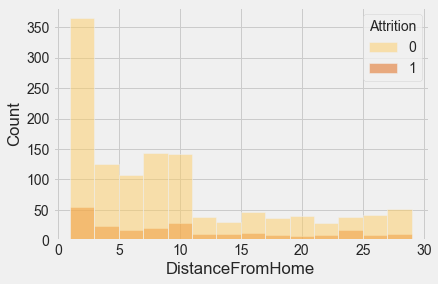

In [12]:
sns.histplot(data=df, x='DistanceFromHome', hue='Attrition', palette='YlOrBr')

<AxesSubplot:xlabel='Education', ylabel='Count'>

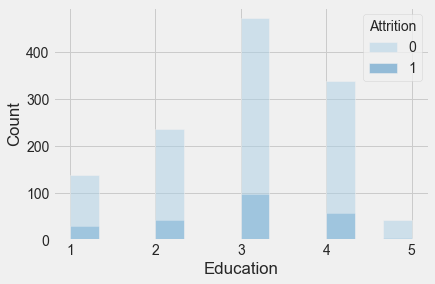

In [13]:
sns.histplot(data=df, x='Education', hue='Attrition', palette='Blues')

<AxesSubplot:xlabel='RelationshipSatisfaction', ylabel='Count'>

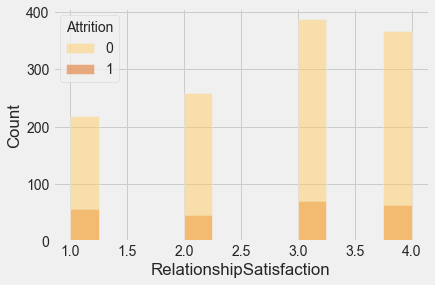

In [14]:
sns.histplot(data=df, x='RelationshipSatisfaction', hue='Attrition', palette='YlOrBr')

<AxesSubplot:xlabel='EnvironmentSatisfaction', ylabel='Count'>

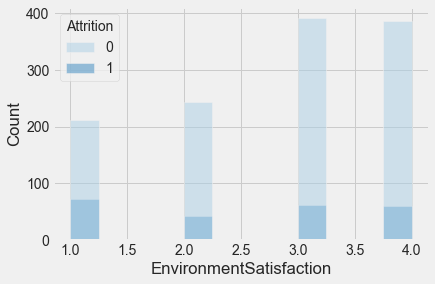

In [15]:
sns.histplot(data=df, x='EnvironmentSatisfaction', hue='Attrition', palette='Blues')

<AxesSubplot:xlabel='JobInvolvement', ylabel='Count'>

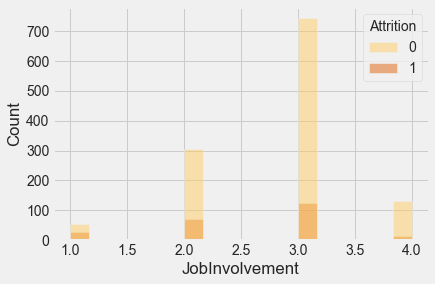

In [16]:
sns.histplot(data=df, x='JobInvolvement', hue='Attrition', palette='YlOrBr')

<AxesSubplot:xlabel='JobLevel', ylabel='Count'>

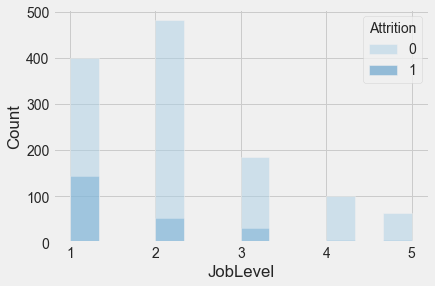

In [17]:
sns.histplot(data=df, x='JobLevel', hue='Attrition', palette='Blues')

<AxesSubplot:xlabel='JobSatisfaction', ylabel='Count'>

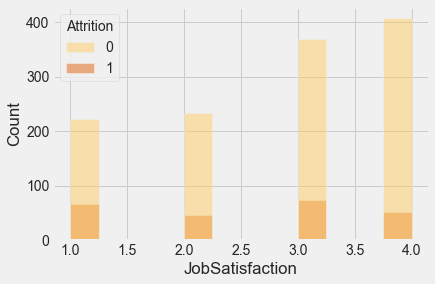

In [18]:
sns.histplot(data=df, x='JobSatisfaction', hue='Attrition', palette='YlOrBr')

<AxesSubplot:xlabel='NumCompaniesWorked', ylabel='Count'>

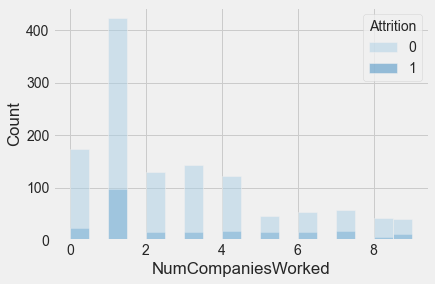

In [19]:
sns.histplot(data=df, x='NumCompaniesWorked', hue='Attrition', palette='Blues')

<AxesSubplot:xlabel='PercentSalaryHike', ylabel='Count'>

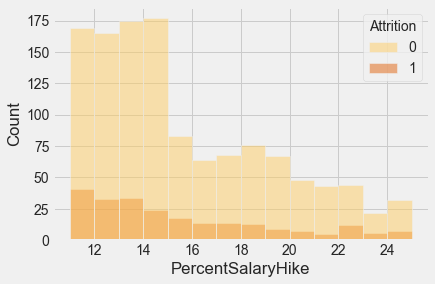

In [20]:
sns.histplot(data=df, x='PercentSalaryHike', hue='Attrition', palette='YlOrBr')

<AxesSubplot:xlabel='StockOptionLevel', ylabel='Count'>

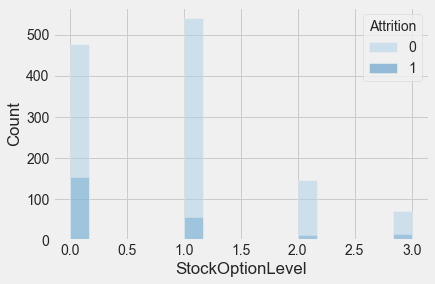

In [21]:
sns.histplot(data=df, x='StockOptionLevel', hue='Attrition', palette='Blues')

<AxesSubplot:xlabel='TrainingTimesLastYear', ylabel='Count'>

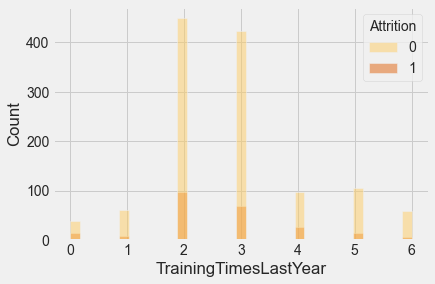

In [22]:
sns.histplot(data=df, x='TrainingTimesLastYear', hue='Attrition', palette='YlOrBr')

### It seems that EnvironmentSatisfaction, JobSatisfaction, PerformanceRating, and RelationshipSatisfaction features don't have big impact on the detrmination of Attrition of employees

<AxesSubplot:xlabel='Age', ylabel='Count'>

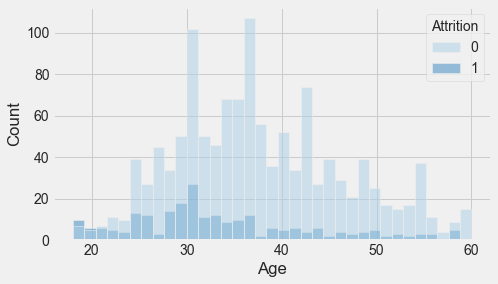

In [23]:
plt.figure(figsize=(7, 4))
sns.histplot(data=df, x='Age', hue='Attrition', palette='Blues', bins=35 )

<AxesSubplot:xlabel='MonthlyIncome', ylabel='Count'>

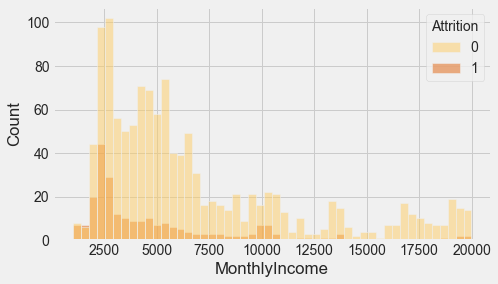

In [24]:
plt.figure(figsize=(7, 4))
sns.histplot(data=df, x='MonthlyIncome', hue='Attrition', palette='YlOrBr', bins=50)

<AxesSubplot:xlabel='YearsAtCompany', ylabel='Count'>

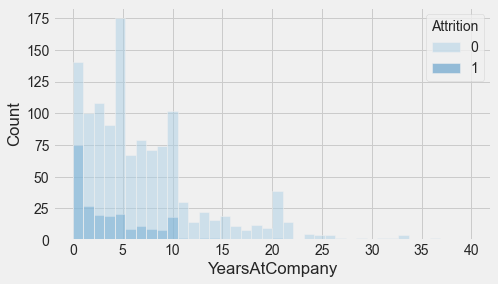

In [25]:
plt.figure(figsize=(7, 4))
sns.histplot(data=df, x='YearsAtCompany', hue='Attrition', palette='Blues')

<AxesSubplot:xlabel='TotalWorkingYears', ylabel='Count'>

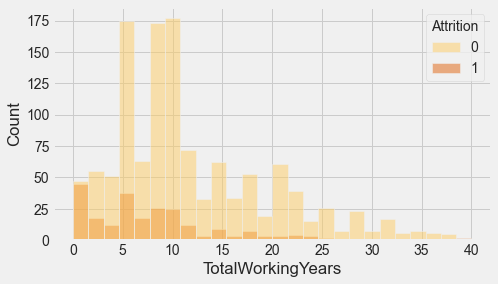

In [26]:
plt.figure(figsize=(7,4))
sns.histplot(data=df, x='TotalWorkingYears', hue='Attrition', palette='YlOrBr')

<AxesSubplot:xlabel='BusinessTravel', ylabel='Count'>

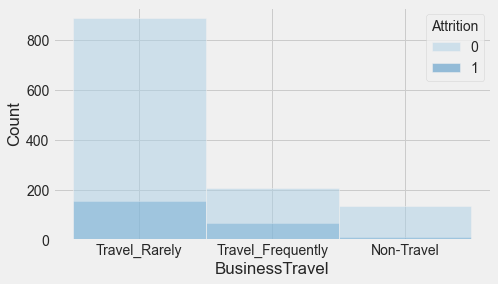

In [27]:
plt.figure(figsize=(7,4))
sns.histplot(data=df, x='BusinessTravel', hue='Attrition', palette='Blues')

<AxesSubplot:xlabel='Age', ylabel='count'>

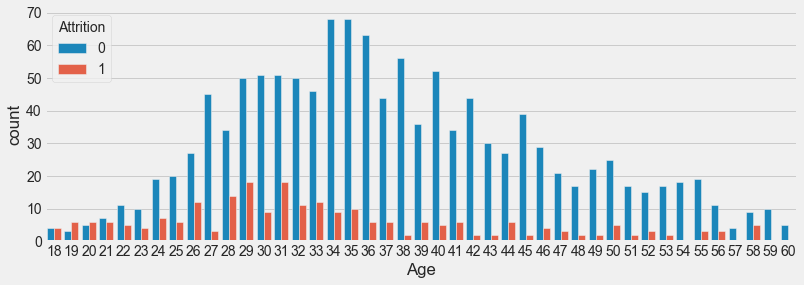

In [28]:
plt.figure(figsize=(12,4))
sns.countplot(x ='Age', data = df, hue='Attrition')

<AxesSubplot:xlabel='Department', ylabel='count'>

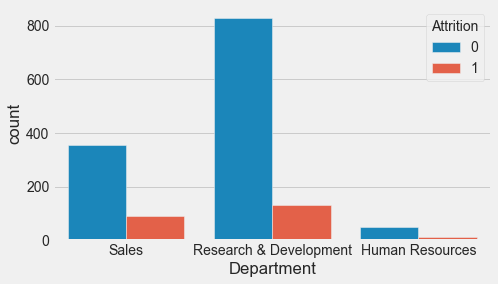

In [29]:
plt.figure(figsize=(7,4))
sns.countplot(x ='Department', data = df, hue='Attrition')

<AxesSubplot:xlabel='EducationField', ylabel='count'>

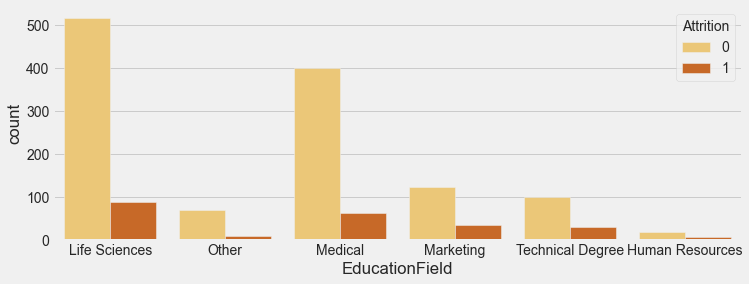

In [30]:
plt.figure(figsize=(11,4))
sns.countplot(x ='EducationField', data = df, hue='Attrition',palette='YlOrBr')

<AxesSubplot:xlabel='Gender', ylabel='count'>

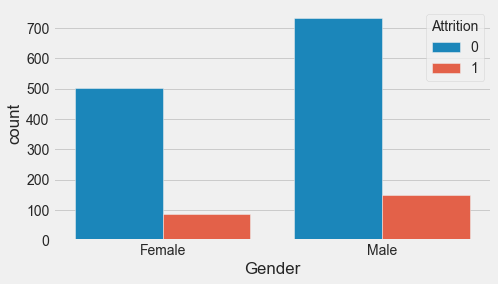

In [31]:
plt.figure(figsize=(7,4))
sns.countplot(x ='Gender', data = df, hue='Attrition')

(array([0, 1, 2, 3, 4, 5, 6, 7, 8]),
 [Text(0, 0, 'Sales Executive'),
  Text(1, 0, 'Research Scientist'),
  Text(2, 0, 'Laboratory Technician'),
  Text(3, 0, 'Manufacturing Director'),
  Text(4, 0, 'Healthcare Representative'),
  Text(5, 0, 'Manager'),
  Text(6, 0, 'Sales Representative'),
  Text(7, 0, 'Research Director'),
  Text(8, 0, 'Human Resources')])

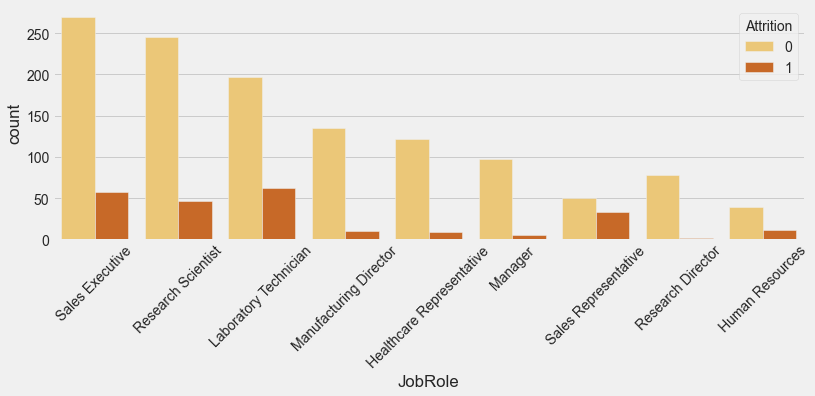

In [32]:
plt.figure(figsize=(12,4))
sns.countplot(x ='JobRole', data = df, hue='Attrition',palette='YlOrBr')
plt.xticks(rotation=45)

<AxesSubplot:xlabel='MaritalStatus', ylabel='count'>

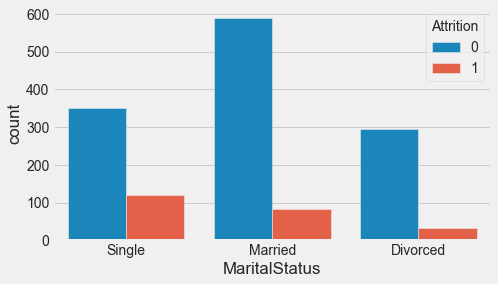

In [33]:
plt.figure(figsize=(7,4))
sns.countplot(x ='MaritalStatus', data = df, hue='Attrition')

<AxesSubplot:xlabel='OverTime', ylabel='count'>

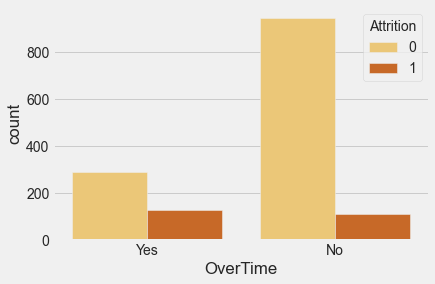

In [34]:
plt.figure(figsize=(6,4))
sns.countplot(x ='OverTime', data = df, hue='Attrition', palette='YlOrBr')

<AxesSubplot:xlabel='Attrition', ylabel='MonthlyIncome'>

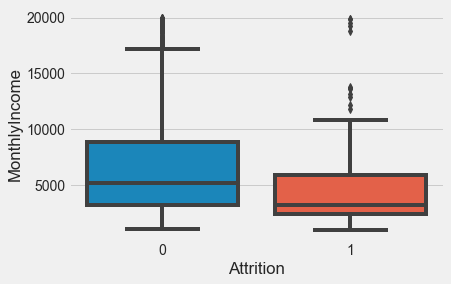

In [35]:
sns.boxplot(x = 'Attrition', y = 'MonthlyIncome', data = df)

# Conclusions:

The workers with low JobLevel, MonthlyIncome, YearAtCompany, and TotalWorkingYears are more likely to quit there jobs.
BusinessTravel : The workers who travel alot are more likely to quit then other employees.

Department : The worker in Research & Development are more likely to stay then the workers on other departement.

EducationField : The workers with Human Resources and Technical Degree are more likely to quit then employees from other fields of educations.

Gender : The Male are more likely to quit.

JobRole : The workers in Laboratory Technician, Sales Representative, and Human Resources are more likely to quit than the workers in other positions.

MaritalStatus : The workers who have Single marital status are more likely to quit than the Married, and Divorced.

OverTime : The workers who work more hours are likely to quit than others.

 ## Correlation Matrix

<AxesSubplot:>

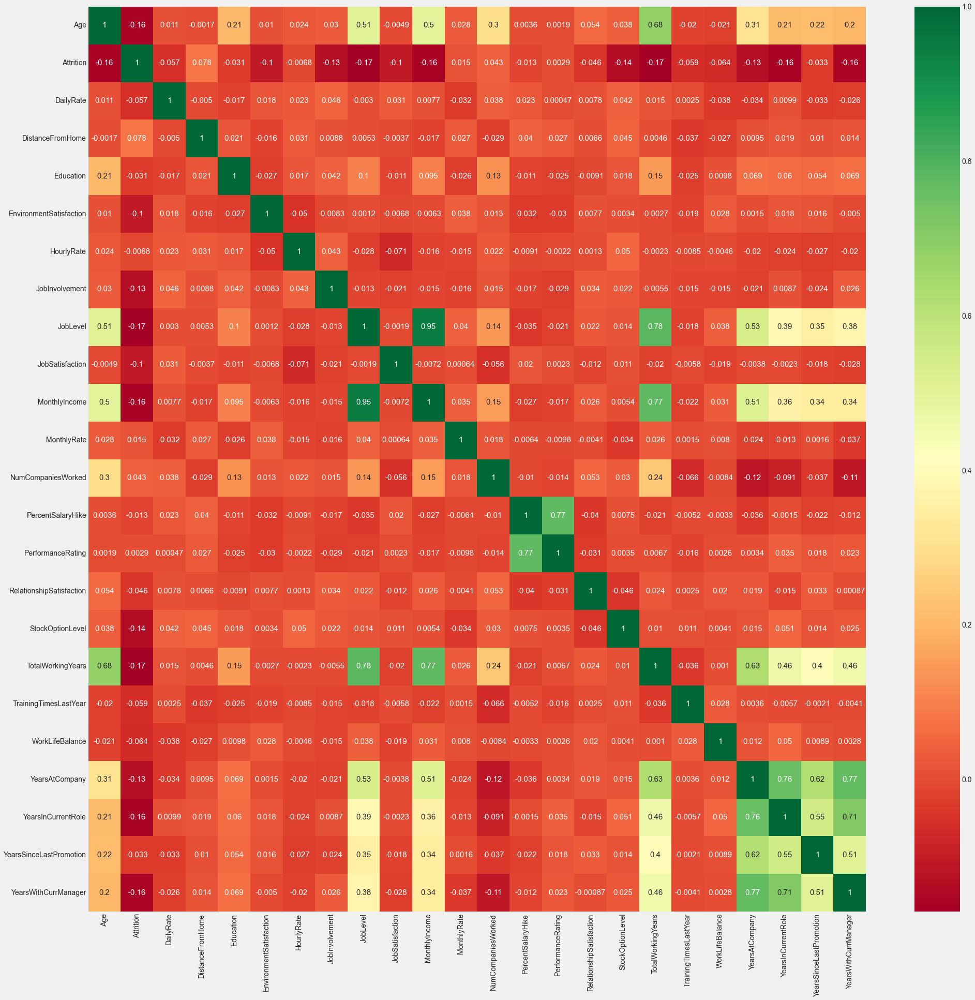

In [36]:
plt.figure(figsize=(30, 30))
sns.heatmap(df.corr(), annot=True, cmap="RdYlGn", annot_kws={"size":15})

<AxesSubplot:>

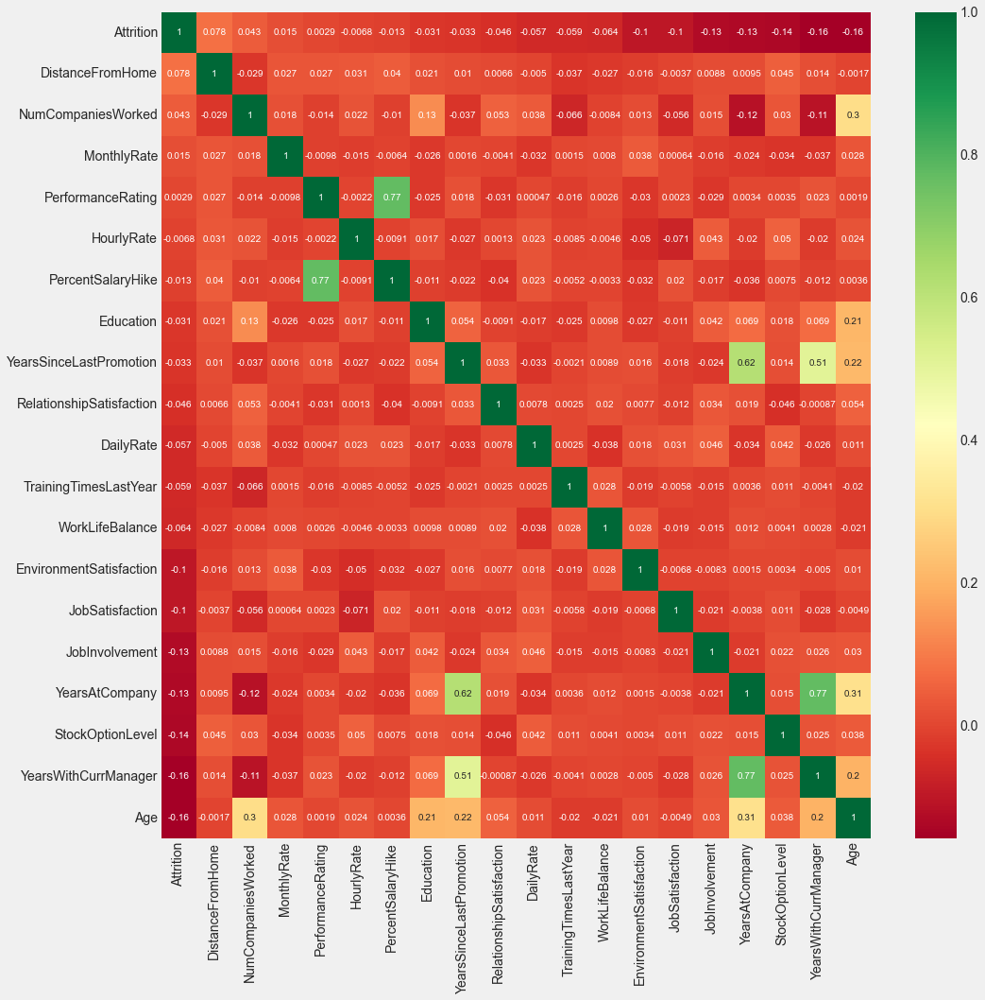

In [37]:
col = df.corr().nlargest(20, "Attrition").Attrition.index
plt.figure(figsize=(15, 15))
sns.heatmap(df[col].corr(), annot=True, cmap="RdYlGn", annot_kws={"size":10})

In [38]:
df.drop('Attrition', axis=1).corrwith(df.Attrition).hvplot.barh()

:Bars   [index]   (0)

## Analysis of correlation results (sample analysis):

Monthly income is highly correlated with Job level.

Job level is highly correlated with total working hours.

Monthly income is highly correlated with total working hours.

Age is also positively correlated with the Total working hours.

Marital status and stock option level are negatively correlated

In [39]:
# Transform categorical data into dummies
dummy_col = [column for column in df.drop('Attrition', axis=1).columns if df[column].nunique() < 20]
data = pd.get_dummies(df, columns=dummy_col, drop_first=True, dtype='uint8')
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Columns: 136 entries, Age to YearsWithCurrManager_17
dtypes: int32(1), int64(8), uint8(127)
memory usage: 280.1 KB


In [40]:
print(data.shape)

(1470, 136)


In [41]:
# Remove duplicate Features
data = data.T.drop_duplicates()
data = data.T

# Remove Duplicate Rows
data.drop_duplicates(inplace=True)

print(data.shape)

(1470, 136)


<AxesSubplot:>

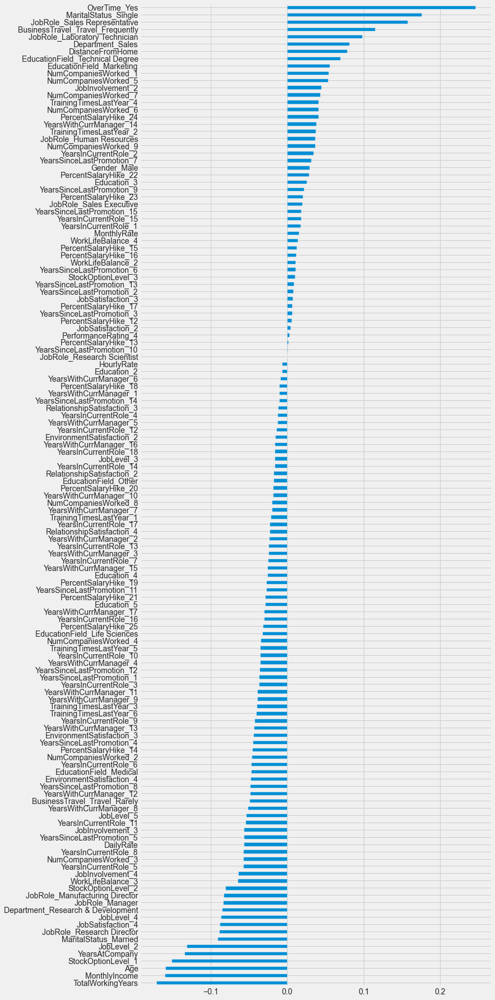

In [42]:
plt.figure(figsize=(15, 15))
data.drop('Attrition', axis=1).corrwith(data.Attrition).sort_values().plot(kind='barh', figsize=(10, 30))

In [43]:
feature_correlation = data.drop('Attrition', axis=1).corrwith(data.Attrition).sort_values()
model_col = feature_correlation[np.abs(feature_correlation) > 0.02].index
len(model_col)

92

# Applying machine learning algorithms

In [44]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler

X = data.drop('Attrition', axis=1)
y = data.Attrition

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42,
                                                    stratify=y)

scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)
X_std = scaler.transform(X)

In [45]:
def feature_imp(df, model):
    fi = pd.DataFrame()
    fi["feature"] = df.columns
    fi["importance"] = model.feature_importances_
    return fi.sort_values(by="importance", ascending=False)


In [46]:
stay = (y_train.value_counts()[0] / y_train.shape)[0]
leave = (y_train.value_counts()[1] / y_train.shape)[0]

print("------------------TRAIN--------------------")
print(f"Staying Rate: {stay * 100:.2f}%")
print(f"Leaving Rate: {leave * 100 :.2f}%")

stay = (y_test.value_counts()[0] / y_test.shape)[0]
leave = (y_test.value_counts()[1] / y_test.shape)[0]

print("------------------TEST---------------------")
print(f"Staying Rate: {stay * 100:.2f}%")
print(f"Leaving Rate: {leave * 100 :.2f}%")

------------------TRAIN--------------------
Staying Rate: 83.87%
Leaving Rate: 16.13%
------------------TEST---------------------
Staying Rate: 83.90%
Leaving Rate: 16.10%


In [47]:
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, roc_auc_score

def evaluate(model, X_train, X_test, y_train, y_test):
    y_test_pred = model.predict(X_test)
    y_train_pred = model.predict(X_train)
    
    print("TRAINIG RESULTS: \n------------------------------------")
    clf_report = pd.DataFrame(classification_report(y_train, y_train_pred, output_dict=True))
    print(f"CONFUSION MATRIX:\n{confusion_matrix(y_train, y_train_pred)}")
    print(f"ACCURACY SCORE:\n{accuracy_score(y_train, y_train_pred):.4f}")
    print(f"CLASSIFICATION REPORT:\n{clf_report}")

    print("\nTESTING RESULTS: \n-------------------------------------")
    clf_report = pd.DataFrame(classification_report(y_test, y_test_pred, output_dict=True))
    print(f"CONFUSION MATRIX:\n{confusion_matrix(y_test, y_test_pred)}")
    print(f"ACCURACY SCORE:\n{accuracy_score(y_test, y_test_pred):.4f}")
    print(f"CLASSIFICATION REPORT:\n{clf_report}")

# Logistic Regression

In [48]:
from sklearn.linear_model import LogisticRegression

lr_clf = LogisticRegression(solver='liblinear', penalty='l1')
lr_clf.fit(X_train_std, y_train)

evaluate(lr_clf, X_train_std, X_test_std, y_train, y_test)

TRAINIG RESULTS: 
------------------------------------
CONFUSION MATRIX:
[[849  14]
 [ 59 107]]
ACCURACY SCORE:
0.9291
CLASSIFICATION REPORT:
               0      1  accuracy  macro avg  weighted avg
precision   0.94   0.88      0.93       0.91          0.93
recall      0.98   0.64      0.93       0.81          0.93
f1-score    0.96   0.75      0.93       0.85          0.92
support   863.00 166.00      0.93    1029.00       1029.00

TESTING RESULTS: 
-------------------------------------
CONFUSION MATRIX:
[[348  22]
 [ 43  28]]
ACCURACY SCORE:
0.8526
CLASSIFICATION REPORT:
               0     1  accuracy  macro avg  weighted avg
precision   0.89  0.56      0.85       0.73          0.84
recall      0.94  0.39      0.85       0.67          0.85
f1-score    0.91  0.46      0.85       0.69          0.84
support   370.00 71.00      0.85     441.00        441.00


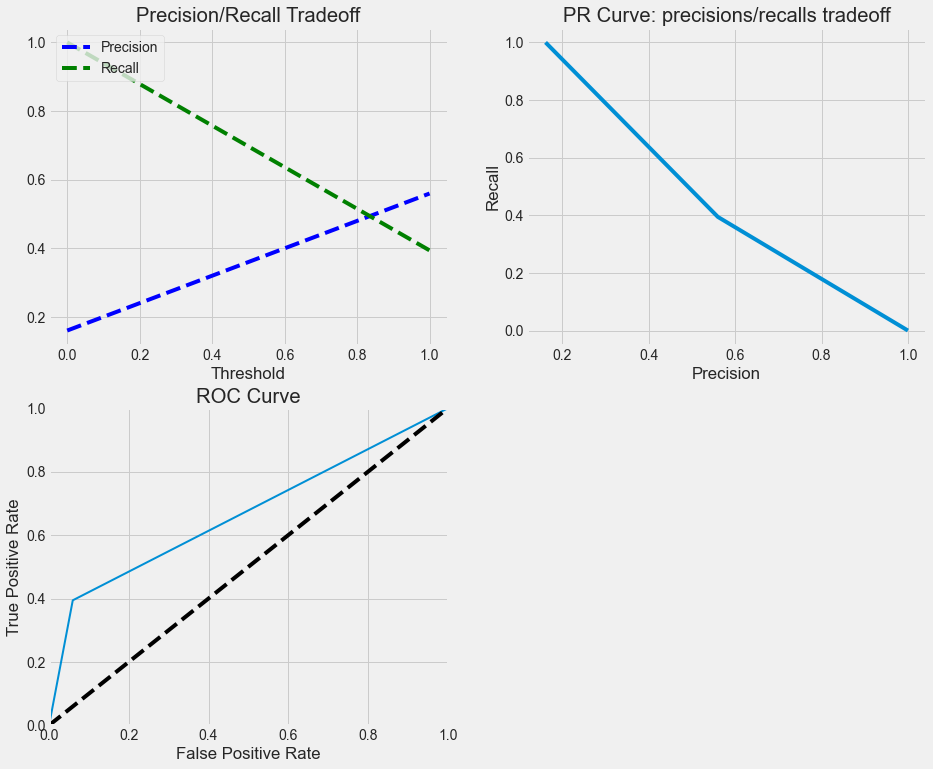

In [49]:
from sklearn.metrics import precision_recall_curve, roc_curve

def plot_precision_recall_vs_threshold(precisions, recalls, thresholds):
    plt.plot(thresholds, precisions[:-1], "b--", label="Precision")
    plt.plot(thresholds, recalls[:-1], "g--", label="Recall")
    plt.xlabel("Threshold")
    plt.legend(loc="upper left")
    plt.title("Precision/Recall Tradeoff")
    

def plot_roc_curve(fpr, tpr, label=None):
    plt.plot(fpr, tpr, linewidth=2, label=label)
    plt.plot([0, 1], [0, 1], "k--")
    plt.axis([0, 1, 0, 1])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    
    
precisions, recalls, thresholds = precision_recall_curve(y_test, lr_clf.predict(X_test_std))
plt.figure(figsize=(14, 25))
plt.subplot(4, 2, 1)
plot_precision_recall_vs_threshold(precisions, recalls, thresholds)

plt.subplot(4, 2, 2)
plt.plot(precisions, recalls)
plt.xlabel("Precision")
plt.ylabel("Recall")
plt.title("PR Curve: precisions/recalls tradeoff");

plt.subplot(4, 2, 3)
fpr, tpr, thresholds = roc_curve(y_test, lr_clf.predict(X_test_std))
plot_roc_curve(fpr, tpr)


In [50]:
scores_dict = {
    'Logistic Regression': {
        'Train': roc_auc_score(y_train, lr_clf.predict(X_train)),
        'Test': roc_auc_score(y_test, lr_clf.predict(X_test)),
    },
}

# Random Forest Classifier

In [51]:
from sklearn.ensemble import RandomForestClassifier

rf_clf = RandomForestClassifier(n_estimators=100, bootstrap=False)
#class_weight={0:stay, 1:leave}
                                    
rf_clf.fit(X_train, y_train)

evaluate(rf_clf, X_train, X_test, y_train, y_test)

TRAINIG RESULTS: 
------------------------------------
CONFUSION MATRIX:
[[863   0]
 [  0 166]]
ACCURACY SCORE:
1.0000
CLASSIFICATION REPORT:
               0      1  accuracy  macro avg  weighted avg
precision   1.00   1.00      1.00       1.00          1.00
recall      1.00   1.00      1.00       1.00          1.00
f1-score    1.00   1.00      1.00       1.00          1.00
support   863.00 166.00      1.00    1029.00       1029.00

TESTING RESULTS: 
-------------------------------------
CONFUSION MATRIX:
[[358  12]
 [ 62   9]]
ACCURACY SCORE:
0.8322
CLASSIFICATION REPORT:
               0     1  accuracy  macro avg  weighted avg
precision   0.85  0.43      0.83       0.64          0.78
recall      0.97  0.13      0.83       0.55          0.83
f1-score    0.91  0.20      0.83       0.55          0.79
support   370.00 71.00      0.83     441.00        441.00


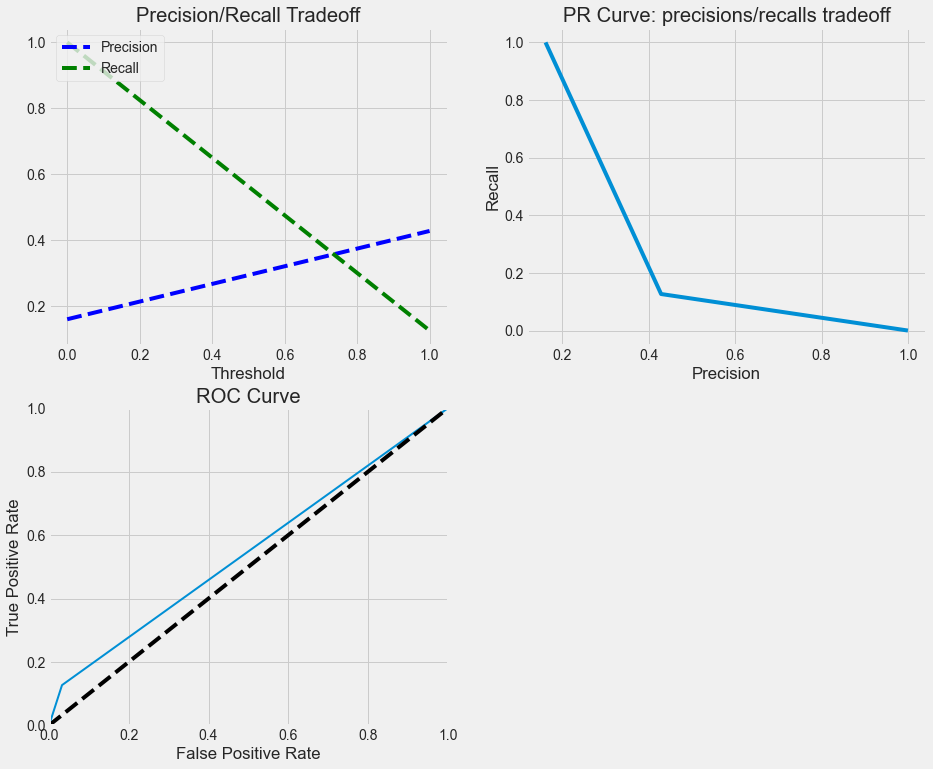

In [52]:
precisions, recalls, thresholds = precision_recall_curve(y_test, rf_clf.predict(X_test))
plt.figure(figsize=(14, 25))
plt.subplot(4, 2, 1)
plot_precision_recall_vs_threshold(precisions, recalls, thresholds)

plt.subplot(4, 2, 2)
plt.plot(precisions, recalls)
plt.xlabel("Precision")
plt.ylabel("Recall")
plt.title("PR Curve: precisions/recalls tradeoff");

plt.subplot(4, 2, 3)
fpr, tpr, thresholds = roc_curve(y_test, rf_clf.predict(X_test))
plot_roc_curve(fpr, tpr)

In [53]:
scores_dict['Random Forest'] = {
        'Train': roc_auc_score(y_train, rf_clf.predict(X_train)),
        'Test': roc_auc_score(y_test, rf_clf.predict(X_test)),
    }

Text(0.5, 1.0, 'Feature Importance according to Random Forest')

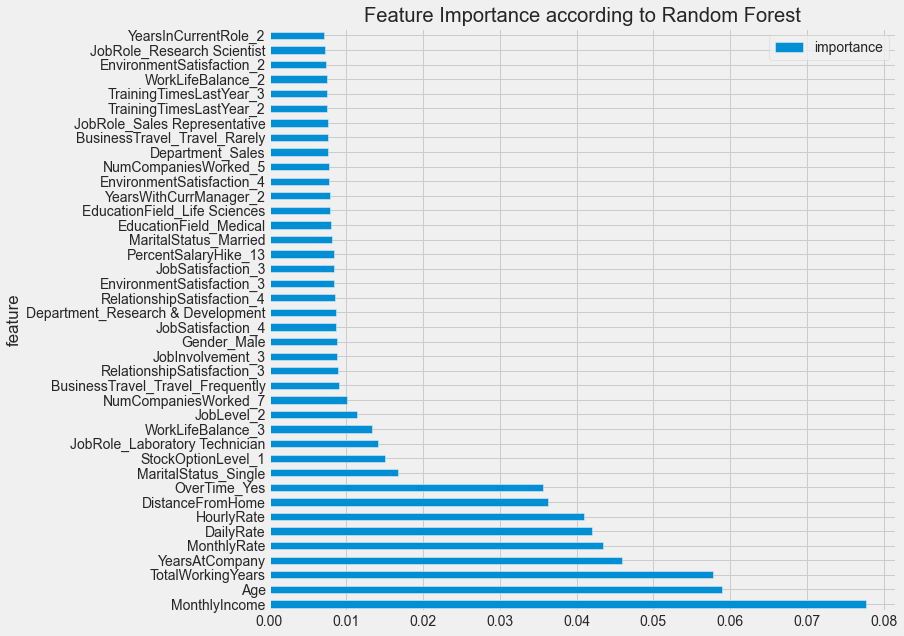

In [54]:
df = feature_imp(X, rf_clf)[:40]
df.set_index('feature', inplace=True)
df.plot(kind='barh', figsize=(10, 10))
plt.title('Feature Importance according to Random Forest')

# Support Vector Machine

In [55]:
from sklearn.svm import SVC

svm_clf = SVC(kernel='linear')
svm_clf.fit(X_train_std, y_train)

evaluate(svm_clf, X_train_std, X_test_std, y_train, y_test)

TRAINIG RESULTS: 
------------------------------------
CONFUSION MATRIX:
[[855   8]
 [ 47 119]]
ACCURACY SCORE:
0.9466
CLASSIFICATION REPORT:
               0      1  accuracy  macro avg  weighted avg
precision   0.95   0.94      0.95       0.94          0.95
recall      0.99   0.72      0.95       0.85          0.95
f1-score    0.97   0.81      0.95       0.89          0.94
support   863.00 166.00      0.95    1029.00       1029.00

TESTING RESULTS: 
-------------------------------------
CONFUSION MATRIX:
[[345  25]
 [ 44  27]]
ACCURACY SCORE:
0.8435
CLASSIFICATION REPORT:
               0     1  accuracy  macro avg  weighted avg
precision   0.89  0.52      0.84       0.70          0.83
recall      0.93  0.38      0.84       0.66          0.84
f1-score    0.91  0.44      0.84       0.67          0.83
support   370.00 71.00      0.84     441.00        441.00


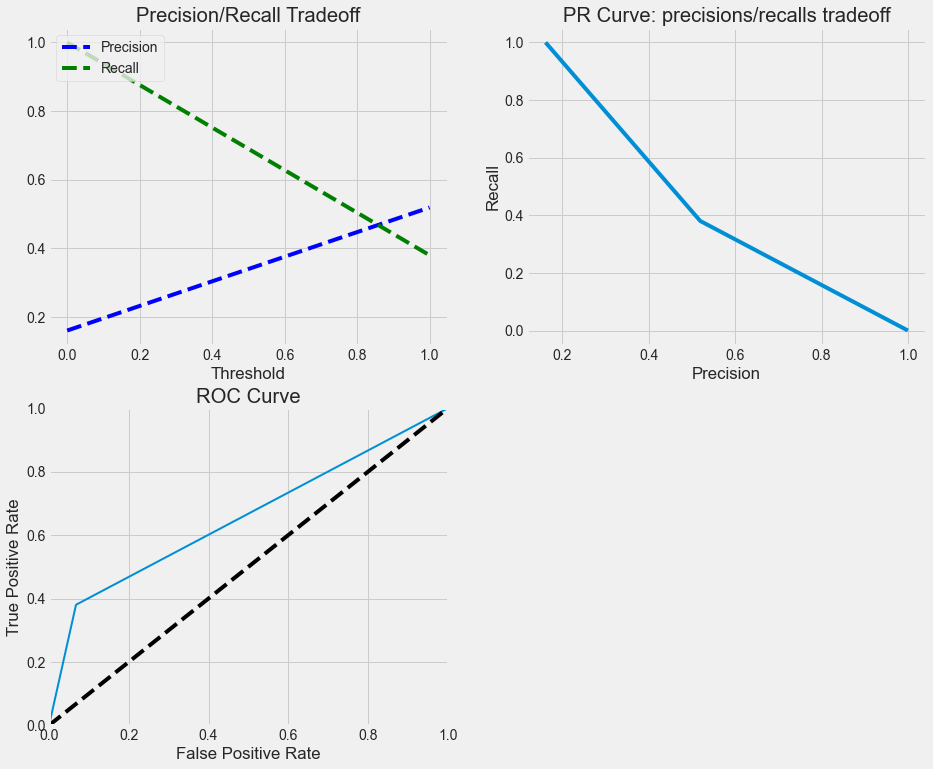

In [56]:
precisions, recalls, thresholds = precision_recall_curve(y_test, svm_clf.predict(X_test_std))
plt.figure(figsize=(14, 25))
plt.subplot(4, 2, 1)
plot_precision_recall_vs_threshold(precisions, recalls, thresholds)

plt.subplot(4, 2, 2)
plt.plot(precisions, recalls)
plt.xlabel("Precision")
plt.ylabel("Recall")
plt.title("PR Curve: precisions/recalls tradeoff");

plt.subplot(4, 2, 3)
fpr, tpr, thresholds = roc_curve(y_test, svm_clf.predict(X_test_std))
plot_roc_curve(fpr, tpr)

In [57]:
scores_dict['Support Vector Machine'] = {
        'Train': roc_auc_score(y_train, svm_clf.predict(X_train_std)),
        'Test': roc_auc_score(y_test, svm_clf.predict(X_test_std)),
    }

# Decision Tree Classifier

In [58]:
from sklearn.tree import DecisionTreeClassifier
dt_clf=DecisionTreeClassifier()

dt_clf.fit(X_train_std, y_train)
evaluate(dt_clf, X_train_std, X_test_std, y_train, y_test)

TRAINIG RESULTS: 
------------------------------------
CONFUSION MATRIX:
[[863   0]
 [  0 166]]
ACCURACY SCORE:
1.0000
CLASSIFICATION REPORT:
               0      1  accuracy  macro avg  weighted avg
precision   1.00   1.00      1.00       1.00          1.00
recall      1.00   1.00      1.00       1.00          1.00
f1-score    1.00   1.00      1.00       1.00          1.00
support   863.00 166.00      1.00    1029.00       1029.00

TESTING RESULTS: 
-------------------------------------
CONFUSION MATRIX:
[[327  43]
 [ 54  17]]
ACCURACY SCORE:
0.7800
CLASSIFICATION REPORT:
               0     1  accuracy  macro avg  weighted avg
precision   0.86  0.28      0.78       0.57          0.77
recall      0.88  0.24      0.78       0.56          0.78
f1-score    0.87  0.26      0.78       0.57          0.77
support   370.00 71.00      0.78     441.00        441.00


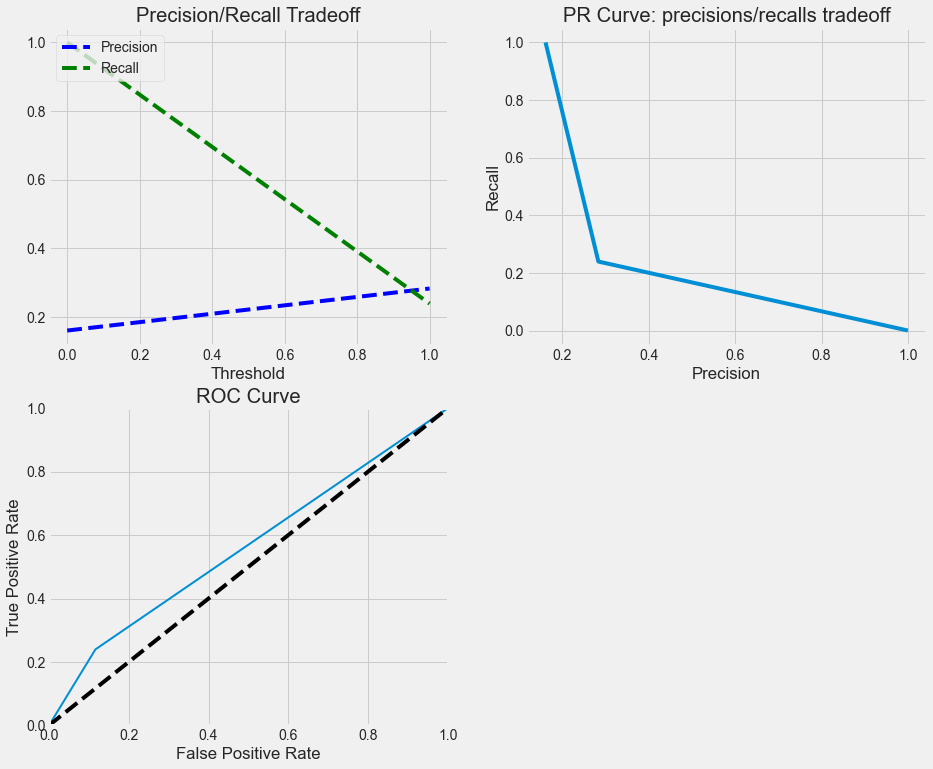

In [59]:
precisions, recalls, thresholds = precision_recall_curve(y_test, dt_clf.predict(X_test_std))
plt.figure(figsize=(14, 25))
plt.subplot(4, 2, 1)
plot_precision_recall_vs_threshold(precisions, recalls, thresholds)

plt.subplot(4, 2, 2)
plt.plot(precisions, recalls)
plt.xlabel("Precision")
plt.ylabel("Recall")
plt.title("PR Curve: precisions/recalls tradeoff");

plt.subplot(4, 2, 3)
fpr, tpr, thresholds = roc_curve(y_test, dt_clf.predict(X_test_std))
plot_roc_curve(fpr, tpr)

In [60]:
scores_dict['Decision Tree Classifier'] = {
        'Train': roc_auc_score(y_train, dt_clf.predict(X_train_std)),
        'Test': roc_auc_score(y_test, dt_clf.predict(X_test_std)),
    }

# K Nearest Neighbour

In [61]:
from sklearn.neighbors import KNeighborsClassifier
knn_clf = KNeighborsClassifier(n_neighbors=3)

knn_clf.fit(X_train_std, y_train)
evaluate(knn_clf, X_train_std, X_test_std, y_train, y_test)

TRAINIG RESULTS: 
------------------------------------
CONFUSION MATRIX:
[[847  16]
 [ 93  73]]
ACCURACY SCORE:
0.8941
CLASSIFICATION REPORT:
               0      1  accuracy  macro avg  weighted avg
precision   0.90   0.82      0.89       0.86          0.89
recall      0.98   0.44      0.89       0.71          0.89
f1-score    0.94   0.57      0.89       0.76          0.88
support   863.00 166.00      0.89    1029.00       1029.00

TESTING RESULTS: 
-------------------------------------
CONFUSION MATRIX:
[[344  26]
 [ 60  11]]
ACCURACY SCORE:
0.8050
CLASSIFICATION REPORT:
               0     1  accuracy  macro avg  weighted avg
precision   0.85  0.30      0.80       0.57          0.76
recall      0.93  0.15      0.80       0.54          0.80
f1-score    0.89  0.20      0.80       0.55          0.78
support   370.00 71.00      0.80     441.00        441.00


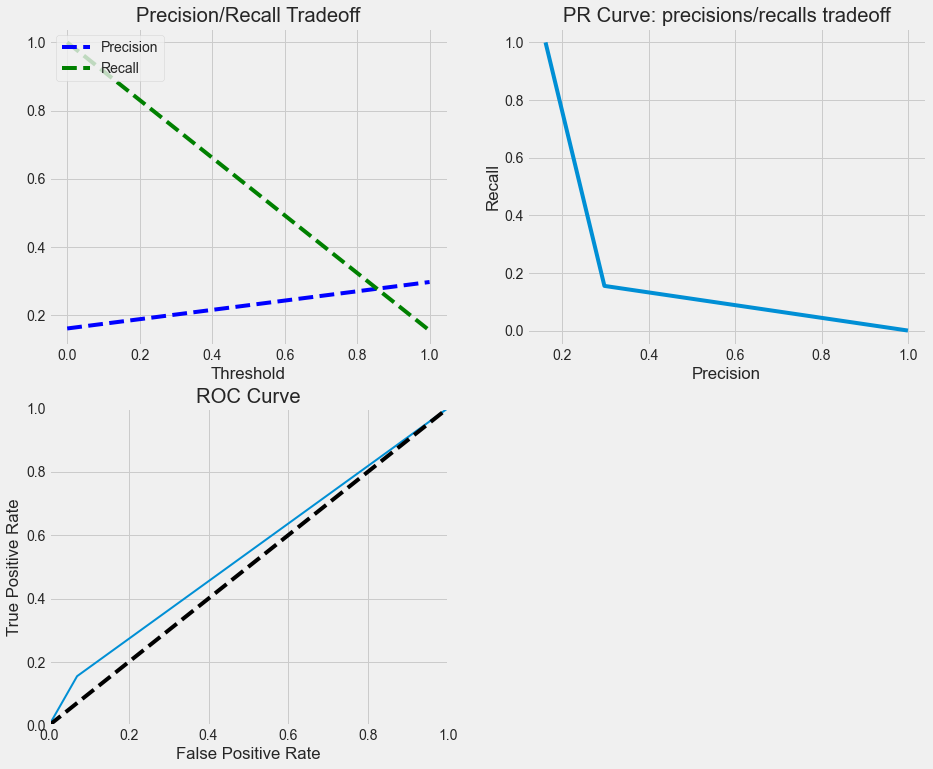

In [62]:
precisions, recalls, thresholds = precision_recall_curve(y_test, knn_clf.predict(X_test_std))
plt.figure(figsize=(14, 25))
plt.subplot(4, 2, 1)
plot_precision_recall_vs_threshold(precisions, recalls, thresholds)

plt.subplot(4, 2, 2)
plt.plot(precisions, recalls)
plt.xlabel("Precision")
plt.ylabel("Recall")
plt.title("PR Curve: precisions/recalls tradeoff");

plt.subplot(4, 2, 3)
fpr, tpr, thresholds = roc_curve(y_test, knn_clf.predict(X_test_std))
plot_roc_curve(fpr, tpr)

In [63]:
scores_dict['K Nearest Neighbour Classifier'] = {
        'Train': roc_auc_score(y_train, knn_clf.predict(X_train_std)),
        'Test': roc_auc_score(y_test, knn_clf.predict(X_test_std)),
    }

# Comparing Models Prerformance 

In [64]:
ml_models = {
    'Random Forest': rf_clf, 
    'Logistic Regression': lr_clf,
    'Support Vector Machine': svm_clf,
    'Decision Tree Classifier': dt_clf,
    'KNN Classifier': knn_clf
}

In [65]:
for model in ml_models:
    print(f"{model.upper():{30}} roc_auc_score: {roc_auc_score(y_test, ml_models[model].predict(X_test)):.3f}")

RANDOM FOREST                  roc_auc_score: 0.547
LOGISTIC REGRESSION            roc_auc_score: 0.546
SUPPORT VECTOR MACHINE         roc_auc_score: 0.550
DECISION TREE CLASSIFIER       roc_auc_score: 0.674
KNN CLASSIFIER                 roc_auc_score: 0.500


(array([0, 1, 2, 3, 4]),
 [Text(0, 0, 'Logistic Regression'),
  Text(1, 0, 'Random Forest'),
  Text(2, 0, 'Support Vector Machine'),
  Text(3, 0, 'Decision Tree Classifier'),
  Text(4, 0, 'K Nearest Neighbour Classifier')])

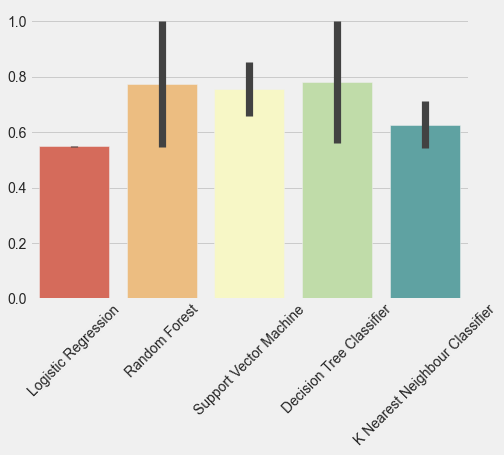

In [66]:
scores_df = pd.DataFrame(scores_dict)
plt.figure(figsize=(7,5))
sns.barplot(data=scores_df,palette='Spectral')
plt.xticks(rotation=45)

In [67]:
scores_df = pd.DataFrame(scores_dict)
# scores_df.plot(kind='barh', figsize=(15, 8))
scores_df.hvplot.barh()

:Bars   [index,Variable]   (value)